# Opendata meteofrance

## Présentation des données

Données climatologiques de toutes les stations de métropole et d'outre-mer depuis leur ouverture, pour tous les paramètres disponibles. Ces données ont subi un contrôle climatologique.

### Informations techniques

Les données quotidiennes sont proposées en téléchargement, par département, et par lots de période au format csv compressé.

L'ensemble des paramètres est fourni pour l'ensemble des stations météorologiques.

La mise à jour des fichiers est annuelle pour les historiques avant 1950, mensuelle pour les fichiers de 1950 jusqu'à l'année 2021 et quotidiennes pour les deux dernières années

Sources:

* https://meteo.data.gouv.fr/datasets/6569b51ae64326786e4e8e1a

Data:

* [QUOT_departement_33_periode_1842-1949_RR-T-Vent](https://www.data.gouv.fr/fr/datasets/r/bd7854d9-548b-4b3c-bbaa-8586a7060dba)
* [QUOT_departement_33_periode_1950-2021_RR-T-Vent](https://www.data.gouv.fr/fr/datasets/r/b0e78f3d-9085-4d6d-a47d-6d942f5e9a54)
* [QUOT_departement_33_periode_2023-2024_RR-T-Vent](https://www.data.gouv.fr/fr/datasets/r/5f196a76-ba4f-4aa7-af28-eff6c8797b50)




In [105]:
import os
import urllib.request

DATA_FOLDER = "_data"
DOWNLOAD_URLS = [
    "https://www.data.gouv.fr/fr/datasets/r/bd7854d9-548b-4b3c-bbaa-8586a7060dba",
    "https://www.data.gouv.fr/fr/datasets/r/b0e78f3d-9085-4d6d-a47d-6d942f5e9a54",
    "https://www.data.gouv.fr/fr/datasets/r/5f196a76-ba4f-4aa7-af28-eff6c8797b50"
]

def download_file(url, dest_folder):
    if not os.path.exists(dest_folder):
        os.makedirs(dest_folder)
    try:
        req = urllib.request.Request(url)
        with urllib.request.urlopen(req) as response:
            file_path = os.path.join(dest_folder, response.url.split('/')[-1])
            if not os.path.exists(file_path):
                with open(file_path, 'wb') as out_file:
                    data = response.read()
                    out_file.write(data)
                print(f"Downloaded {response.url} into {dest_folder}")
            else:
                print(f"File {file_path} already exists, skipping download.")
    except Exception as e:
        print(f"Failed to download {url}: {e}")

for url in DOWNLOAD_URLS:
    download_file(url, DATA_FOLDER)

Downloaded https://object.files.data.gouv.fr/meteofrance/data/synchro_ftp/BASE/QUOT/Q_33_1842-1949_RR-T-Vent.csv.gz into _data
Downloaded https://object.files.data.gouv.fr/meteofrance/data/synchro_ftp/BASE/QUOT/Q_33_previous-1950-2022_RR-T-Vent.csv.gz into _data
Downloaded https://object.files.data.gouv.fr/meteofrance/data/synchro_ftp/BASE/QUOT/Q_33_latest-2023-2024_RR-T-Vent.csv.gz into _data


In [106]:
import gzip
import shutil

def uncompress_gz_files(folder):
    for root, _, files in os.walk(folder):
        for file in files:
            if file.endswith(".csv.gz"):
                gz_file_path = os.path.join(root, file)
                csv_file_path = os.path.join(root, file[:-3])  # Remove the .gz extension

                if not os.path.exists(csv_file_path):
                    with gzip.open(gz_file_path, 'rb') as f_in:
                        with open(csv_file_path, 'wb') as f_out:
                            shutil.copyfileobj(f_in, f_out)
                    print(f"Uncompressed {gz_file_path} to {csv_file_path}")
                else:
                    print(f"File {csv_file_path} already exists, skipping uncompression.")


uncompress_gz_files(DATA_FOLDER)

Uncompressed _data/Q_33_latest-2023-2024_RR-T-Vent.csv.gz to _data/Q_33_latest-2023-2024_RR-T-Vent.csv
Uncompressed _data/Q_33_1842-1949_RR-T-Vent.csv.gz to _data/Q_33_1842-1949_RR-T-Vent.csv
Uncompressed _data/Q_33_previous-1950-2022_RR-T-Vent.csv.gz to _data/Q_33_previous-1950-2022_RR-T-Vent.csv


### Q_descriptif_champs_RR-T-Vent.csv

```
NUM_POSTE   : numéro Météo-France du poste sur 8 chiffres
NOM_USUEL   : nom usuel du poste
LAT         : latitude, négative au sud (en degrés et millionièmes de degré)
LON         : longitude, négative à l’ouest de GREENWICH (en degrés et millionièmes de degré)
ALTI        : altitude du pied de l'abri ou du pluviomètre si pas d'abri (en m)
AAAAMMJJ    : date de la mesure (année mois jour)
RR          : quantité de précipitation tombée en 24 heures (de 06h FU le jour J à 06h FU le jour J+1). La valeur relevée à J+1 est affectée au jour J (en mm et 1/10)
TN          : température minimale sous abri (en °C et 1/10)
HTN         : heure de TN (hhmm)
TX          : température maximale sous abri (en °C et 1/10)
HTX         : heure de TX (hhmm)
TM          : moyenne quotidienne des températures horaires sous abri (en °C et 1/10)
TNTXM       : moyenne quotidienne (TN+TX)/2 (en °C et 1/10)
TAMPLI      : amplitude thermique quotidienne : écart entre TX et TN quotidiens (TX-TN) (en °C et 1/10)
TNSOL       : température quotidienne minimale à 10 cm au-dessus du sol (en °C et 1/10)
TN50        : température quotidienne minimale à 50 cm au-dessus du sol (en °C et 1/10)
DG          : durée de gel sous abri (T ≤ 0°C) (en mn)
FFM         : moyenne quotidienne de la force du vent moyenné sur 10 mn, à 10 m (en m/s et 1/10)
FF2M        : moyenne quotidienne de la force du vent moyenné sur 10 mn, à 2 m (en m/s et 1/10)
FXY         : maximum quotidien de la force maximale horaire du vent moyenné sur 10 mn, à 10 m (en m/s et 1/10)
DXY         : direction de FXY (en rose de 360)
HXY         : heure de FXY (hhmm)
FXI         : maximum quotidien de la force maximale horaire du vent instantané, à 10 m (en m/s et 1/10)
DXI         : direction de FXI (en rose de 360)
HXI         : heure de FXI (hhmm)
FXI2        : maximum quotidien de la force maximale horaire du vent instantané, à 2 m (en m/s et 1/10)
DXI2        : direction de FXI2 (en rose de 360)
HXI2        : heure de FXI2 (hhmm)
FXI3S       : maximum quotidien de la force maximale horaire du vent moyenné sur 3 s, à 10 m (en m/s et 1/10)
DXI3S       : direction de FXI3S (en rose de 360)
HXI3S       : heure de FXI3S (hhmm)

A chaque donnée est associé un code qualité (ex: T;QT) :
 9 : donnée filtrée (la donnée a passé les filtres/contrôles de premiers niveaux)
 0 : donnée protégée (la donnée a été validée définitivement par le climatologue)
 1 : donnée validée (la donnée a été validée par contrôle automatique ou par le climatologue)
 2 : donnée douteuse en cours de vérification (la donnée a été mise en doute par contrôle automatique)
 
```

## Calcul du nombre de jours "situation inhabituelle" pour le SIBA



```
Les notions de « fortes pluies » et d’ « inondation » manquant de précision et pouvant être sujettes à interprétation, il avait été proposé fin 2016, après une analyse statistique des situations rencontrées lors des différents épisodes pluvieux enregistrés de 2013 à 2016, que soit déclaré au niveau du Bassin d’Arcachon « situation inhabituelle » lorsque les précipitations cumulées sur 7 jours consécutifs dépassent 70 mm. 
```

[Source plainte adeba contre le siba](https://adeba.fr/index.php/2023/12/31/plainte-contre-le-siba-pour-pollution-des-eaux-du-bassin/)


## Objectif

Le but de cette feuille de calcul est de vérifier le caractère inhabituel de 70mm de précipitations cumulées sur 7 jours consécutifs.

In [107]:
import glob

import pandas as pd

q_33_csv = glob.glob(os.path.join(DATA_FOLDER, "Q_33_*.csv"))

q_33_csv                   

['_data/Q_33_1842-1949_RR-T-Vent.csv',
 '_data/Q_33_previous-1950-2022_RR-T-Vent.csv',
 '_data/Q_33_latest-2023-2024_RR-T-Vent.csv']

In [108]:
df = pd.concat((pd.read_csv(f, delimiter=";") for f in q_33_csv), ignore_index=True)

## Précipitations sur les 7 derniers jours

La somme sur les 7 derniers jours des précipitations sur les villes du Bassin d'Arcachon (Arcachon, Audenge, Arès, Cap-ferret).

In [109]:
from IPython.display import display
df['DATE'] = pd.to_datetime(df['AAAAMMJJ'], format='%Y%m%d')
df['YEAR'] = df['DATE'].dt.year
df_sorted = df[df['NOM_USUEL'].isin(["ARCACHON", "AUDENGE AGGLOMERATION", "ARES", "CAP-FERRET"])].sort_values(by=['NOM_USUEL', 'DATE'])

df_sorted['SLIDING_RR7'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=7, min_periods=1).sum().reset_index(0, drop=True)
df_sorted['SLIDING_RR30'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=30, min_periods=1).sum().reset_index(0, drop=True)
df_sorted['SLIDING_RR60'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=60, min_periods=1).sum().reset_index(0, drop=True)

df_sorted.describe()



,NUM_POSTE,LAT,LON,ALTI,AAAAMMJJ,RR,QRR,TN,QTN,HTN,...,QDXI3S,HXI3S,QHXI3S,DRR,QDRR,DATE,YEAR,SLIDING_RR7,SLIDING_RR30,SLIDING_RR60
count,9.423700e+04,94237.000000,94237.000000,94237.000000,9.423700e+04,93795.000000,93796.00000,61385.000000,61385.000000,20430.000000,...,28.0,5329.000000,5357.000000,4088.000000,4478.000000,94237,94237.000000,93853.000000,93959.000000,94051.000000
mean,3.309457e+07,44.687370,-1.169653,5.029192,1.956291e+07,2.352193,1.25596,9.901898,3.355364,746.863828,...,1.0,1232.030400,8.908904,150.856898,8.008486,1956-09-20 22:49:49.882954624,1956.224211,16.451882,70.394780,140.565031
min,3.300900e+07,44.630667,-1.252000,2.000000,1.882010e+07,0.000000,1.00000,-13.800000,1.000000,0.000000,...,1.0,0.000000,1.000000,0.000000,1.000000,1882-01-01 00:00:00,1882.000000,0.000000,0.000000,0.000000
25%,3.301100e+07,44.630667,-1.252000,2.000000,1.926052e+07,0.000000,1.00000,6.000000,1.000000,412.000000,...,1.0,536.000000,9.000000,0.000000,9.000000,1926-05-20 00:00:00,1926.000000,2.000000,35.000000,87.500000
50%,3.301100e+07,44.663333,-1.150000,4.000000,1.966030e+07,0.000000,1.00000,10.100000,1.000000,534.000000,...,1.0,1412.000000,9.000000,0.000000,9.000000,1966-03-03 00:00:00,1966.000000,10.000000,61.000000,127.800000
75%,3.323600e+07,44.770000,-1.135000,8.000000,1.988061e+07,2.300000,1.00000,14.400000,9.000000,745.000000,...,1.0,1800.000000,9.000000,184.000000,9.000000,1988-06-11 00:00:00,1988.000000,24.000000,95.600000,179.600000
max,3.323600e+07,44.770000,-1.013333,8.000000,2.024120e+07,121.100000,9.00000,25.300000,9.000000,2359.000000,...,1.0,2359.000000,9.000000,1440.000000,9.000000,2024-12-03 00:00:00,2024.000000,176.000000,408.100000,614.000000
std,1.083836e+05,0.059267,0.073100,2.556075,3.939540e+05,5.074874,1.40790,5.700642,3.646284,610.635402,...,0.0,742.274275,0.848883,265.643712,2.636392,NaN,39.395442,19.124326,47.767538,74.285770


In [110]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


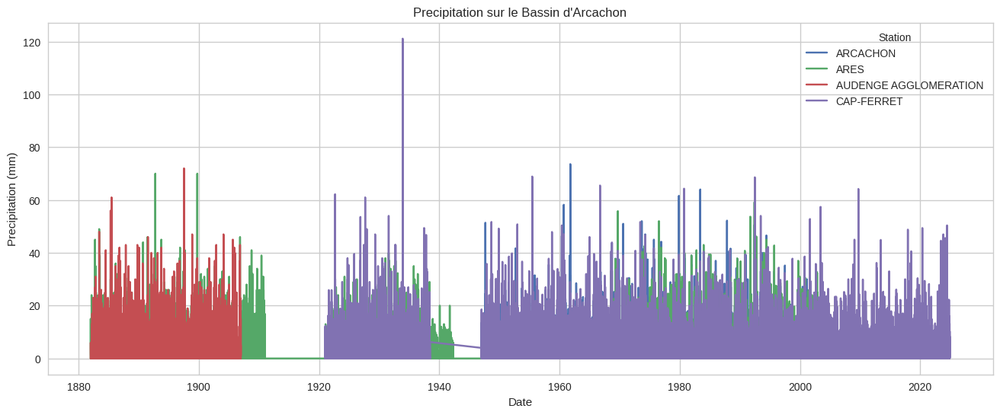

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


# Use a seaborn theme
plt.style.use('seaborn-v0_8-whitegrid')

fig, ax = plt.subplots(figsize=(16, 6))

for name, group in df_sorted.groupby('NOM_USUEL'):
    ax.plot(group['DATE'], group['RR'], label=name)

ax.set_title("Precipitation sur le Bassin d'Arcachon")
ax.set_xlabel('Date')
ax.set_ylabel('Precipitation (mm)')
ax.legend(title='Station')

plt.savefig('results/precipitation_ba.png')
plt.show()

In [112]:
import plotly.express as px
import plotly.io as pio

fig = px.line(df_sorted, x='DATE', y='RR', color='NOM_USUEL', title='Precipitation sur le Bassin d\'Arcachon')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.show()


### Commentaire sur les données

Les séries temporelles de Météo-France autour du bassin d’Arcachon ne sont pas complètes sur les 141 ans de l'intervalle (1882-2023), cependant grâce aux 4 stations (Arcachon, Ares, Audenge, Cap-Ferret) il est possible de vérifier la coherence des données et leur relative homogénéité.

Pour la suite de l'étude nous concentrerons notre attention sur la station du Cap-Ferret car elle offre la série la plus complète sur le dernier siècle.

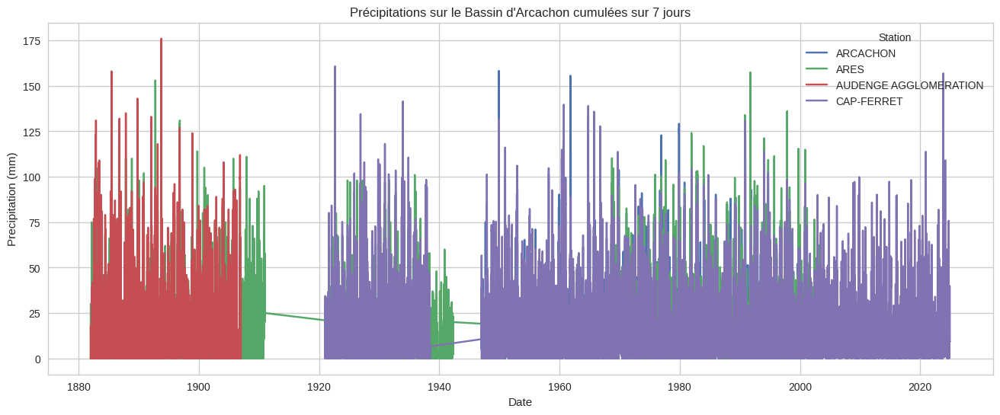

In [113]:
fig, ax = plt.subplots(figsize=(16, 6))

for name, group in df_sorted.groupby('NOM_USUEL'):
    ax.plot(group['DATE'], group['SLIDING_RR7'], label=name)

ax.set_title("Précipitations sur le Bassin d'Arcachon cumulées sur 7 jours")
ax.set_xlabel('Date')
ax.set_ylabel('Precipitation (mm)')
ax.legend(title='Station')

plt.savefig('results/precipitation_RR7_ba.png')
plt.show()

In [114]:
fig = px.line(df_sorted, x='DATE', y='SLIDING_RR7', color='NOM_USUEL', title='Précipitations sur le Bassin d\'Arcachon cumulées sur 7 jours')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.show()

La figure précédente montre que les précipitations cumulées sur 7 jours en 2023 ont déjà été atteintes 6 fois depuis 1882.

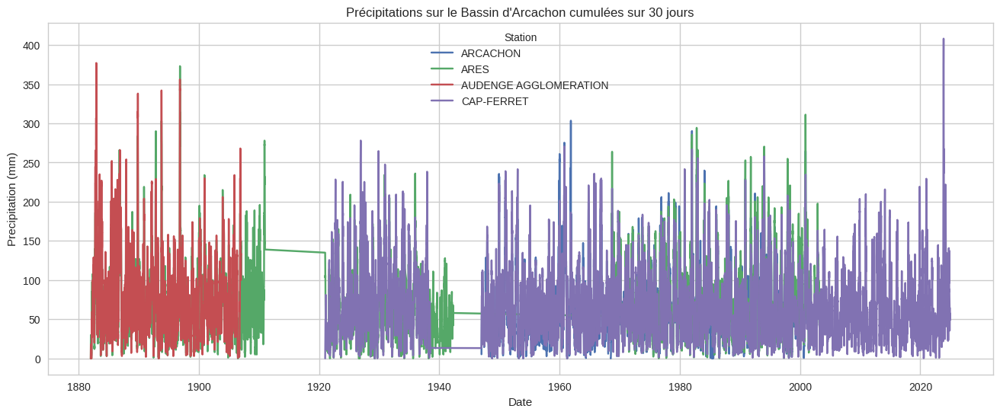

In [115]:
fig, ax = plt.subplots(figsize=(16, 6))

for name, group in df_sorted.groupby('NOM_USUEL'):
    ax.plot(group['DATE'], group['SLIDING_RR30'], label=name)

ax.set_title("Précipitations sur le Bassin d'Arcachon cumulées sur 30 jours")
ax.set_xlabel('Date')
ax.set_ylabel('Precipitation (mm)')
ax.legend(title='Station')

plt.savefig('results/precipitation_RR30_ba.png')
plt.show()

In [116]:
fig = px.line(df_sorted, x='DATE', y='SLIDING_RR30', color='NOM_USUEL', title='Précipitations sur le Bassin d\'Arcachon cumulées sur 30 jours')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.show()


Le mois de novembre 2023 montre une précipitation cumulée sur 30 jours glissant qui établit un nouveau record depuis 1882.

### Vérification des données 

Vérification manuelle des données pour le `CAP-FERRET` en 2023.

#### Filtrage des données

Filtrage des données pour compter le nombre **d’événements inhabituels** par année.

In [117]:
df_filtered_cap_ferret_2023 = df_sorted[(df_sorted['NOM_USUEL'] == "CAP-FERRET") & (df_sorted['YEAR'] == 2023)][['DATE','RR', 'SLIDING_RR7']]
df_filtered_cap_ferret_2024 = df_sorted[(df_sorted['NOM_USUEL'] == "CAP-FERRET") & (df_sorted['YEAR'] == 2024)][['DATE','RR', 'SLIDING_RR7']]

df_filtered_cap_ferret_2023_2024 = pd.concat([df_filtered_cap_ferret_2023, df_filtered_cap_ferret_2024])

def highlight(row):
    if row['SLIDING_RR7'] >= 70:
        return ['background-color: yellow; color: #00008B'] * len(row)
    else:
        return [''] * len(row)

display(df_filtered_cap_ferret_2023_2024.style.apply(highlight, axis=1))


,DATE,RR,SLIDING_RR7
2050492,2023-01-01 00:00:00,2.400000,19.300000
2050493,2023-01-02 00:00:00,0.000000,16.500000
2050494,2023-01-03 00:00:00,0.200000,16.500000
2050495,2023-01-04 00:00:00,0.000000,16.100000
2050496,2023-01-05 00:00:00,0.000000,3.800000
2050497,2023-01-06 00:00:00,0.000000,2.600000
2050498,2023-01-07 00:00:00,16.300000,18.900000
2050499,2023-01-08 00:00:00,3.400000,19.900000
2050500,2023-01-09 00:00:00,0.400000,20.300000
2050501,2023-01-10 00:00:00,1.400000,21.500000


### Nombre d'événements inhabituels par an et par station

Le but est de comprendre si 70 mm de précipitations cumulées sur 7 jours est inhabituel ou régulier. En orange clair les années ou le nombre d’événements inhabituels est supérieur à 10 fois par an.

In [118]:

df_filtered = df_sorted[df_sorted['SLIDING_RR7'] > 70]
days_count = df_filtered.groupby(['NOM_USUEL', 'YEAR']).size().reset_index(name='COUNT')

def highlight(row):
    if row['COUNT'] >= 10:
        return ['background-color: #FFDAB9; color: #00008B'] * len(row)
    else:
        return [''] * len(row)

display(days_count.style.apply(highlight, axis=1))


,NOM_USUEL,YEAR,COUNT
0,ARCACHON,1947,10
1,ARCACHON,1949,10
2,ARCACHON,1950,7
3,ARCACHON,1952,6
4,ARCACHON,1955,3
5,ARCACHON,1958,9
6,ARCACHON,1959,13
7,ARCACHON,1960,22
8,ARCACHON,1961,17
9,ARCACHON,1964,8


In [119]:
fig = px.bar(days_count, x='YEAR', y='COUNT', color='NOM_USUEL', facet_col='NOM_USUEL', facet_col_wrap=1, title='Nombre de jour avec plus de 70mm de précipitation cumulées sur 7j')
fig.update_layout(xaxis_title='Année', yaxis_title='Nombre de jour', legend_title='Station Metéo')
fig.update_layout(width=1200, height=1000)  # Set the width to full and increase the height
fig.show()


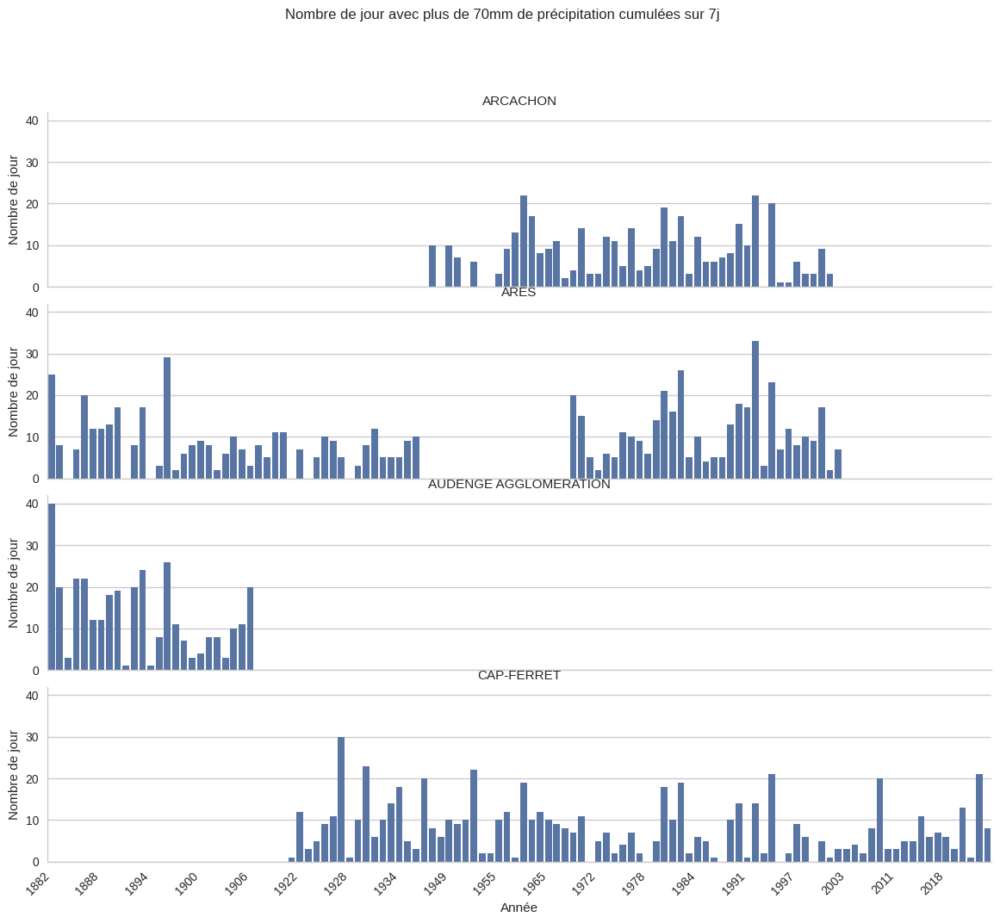

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.ticker import MaxNLocator


# Assuming days_count is already defined
# days_count = pd.read_csv('path_to_your_csv_file.csv')

g = sns.FacetGrid(days_count, col='NOM_USUEL', col_wrap=1, height=5, aspect=2)
g.map(sns.barplot, 'YEAR', 'COUNT', order=sorted(days_count['YEAR'].unique()))

g.set_axis_labels('Année', 'Nombre de jour')
g.set_titles(col_template='{col_name}')
g.fig.suptitle('Nombre de jour avec plus de 70mm de précipitation cumulées sur 7j', y=1.02)

# Rotate x-axis labels
for ax in g.axes.flat:
    ax.xaxis.set_major_locator(MaxNLocator(integer=True, prune='lower',nbins=20))
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_horizontalalignment('right')

plt.subplots_adjust(top=0.9)
g.fig.set_size_inches(12, 10)

plt.savefig('results/nb_days_plus_de70mm_par_7j_ba.png')
plt.show()

## Conclusion

Le graphique ci dessus montre que la définition `évenement inhabituel` retenue par le SIBA de 70mm de precipitation sur 7 jours glissant n'est en fait pas inhabituel. Depuis 1882 autour du bassin on peut observer plusieurs fois par décennie des années avec plus de 10 événements inhabituels. 
A titre d'exemple au Cap-Ferret, il y a AU MOINS UN ÉVÉNEMENT INHABITUEL PAR AN DEPUIS 101 ANS, et 30 ANNÉES AVEC AU MOINS ÉVÈNEMENTS 10 INHABITUELS PAR AN.

En 2023 il y a eu 21 jours avec plus de 70mm de précipitation cumulées sur 7j et 8 en 2024 (au 5 décembre 2024).

Il est également intéressant de remarquer que contrairement a certain element de language du SIBA le nombre d'événements inhabituels par an n'a pas explosé dans la dernière décennie. Le record date de 1882 à AUDENGE avec 40 jours inhabituels.



